# RFP: Maze Solvers

## Project Overview
You are invited to submit a proposal that answers the following question:

### What path will your elf take?

*Please submit your proposal by **2/11/25 at 11:59 PM**.*

## Required Proposal Components

### 1. Data Description
In the code cell below, use [Gymnasium](https://gymnasium.farama.org/) to set up a [Frozen Lake maze](https://gymnasium.farama.org/environments/toy_text/frozen_lake/) for your project. When you are done with the set up, describe the reward system you plan on using.

*Note, a level 5 maze is at least 10 x 10 cells large and contains at least five lake cells.*

In [49]:
import gymnasium as gym
import random
from gymnasium import Wrapper
import pandas as pd

In [57]:
class CustomRewardWrapper(Wrapper):
    def __init__(self, env):
        super().__init__(env)

    def step(self, action):
        # Take a step in the environment
        state, reward, done, truncated, info = self.env.step(action)

       
        if state == self.env.observation_space.n - 1: 
            reward = 50  # Reward for reaching the Gift
        elif done and reward == 0:  # Falling into a lake
            reward = -50  # Penalty for falling into a lake
        else:
            reward = -1  # Penalty for each step to encourage quicker solutions

        return state, reward, done, truncated, info


env = gym.make('FrozenLake-v1', desc=[
    "SFFFFHFFHF",
    "FFHFFFFFFF",
    "FFFHFFHHFF",
    "HFFFFFHFFF",
    "FFFHFFFFFH",
    "FHHFFFHFFF",
    "FFFFHFHFHF",
    "HFFFFHFFFF",
    "FFFHFFFFHH", 
    "HFFFFHFFFG"], 
    is_slippery=False)
env = CustomRewardWrapper(env)

#### Describe your reward system here.

### Frozen Tile = -1
### Lake = -50 and game over
### Gift = +50 and game over

### 2. Training Your Model
In the cell seen below, write the code you need to train a Q-Learning model. Display your final Q-table once you are done training your model.

*Note, level 5 work uses only the standard Python library and Pandas to train your Q-Learning model. A level 4 uses external libraries like Baseline3.*

In [51]:
alpha = 0.7 # Learning rate
gamma = 0.75  # Discount factor
epsilon = 1.0  # Exploration rate
epsilon_decay = 0.99  # Decay rate for exploration
min_epsilon = 0.01  # Minimum exploration rate
episodes = 1000  # Number of episodes

# Initialize the Q-table as a dictionary
Q_table = {}

def get_q_value(state, action):
    return Q_table.get((state, action), 0.0)

def update_q_value(state, action, new_value):
    Q_table[(state, action)] = new_value

def choose_action(state):
    if random.uniform(0, 1) < epsilon:
        return env.action_space.sample()  # Explore
    else:
        # Exploit: Choose action with max Q-value for the current state
        q_values = [get_q_value(state, action) for action in range(env.action_space.n)]
        return q_values.index(max(q_values))

for episode in range(episodes):
    state = env.reset()[0]  # Reset the environment
    done = False
    total_reward = 0

    while not done:
        action = choose_action(state)

        new_state, reward, done, truncated, info = env.step(action)

        # Q-learning update rule
        q_current = get_q_value(state, action)
        q_next_max = max([get_q_value(new_state, a) for a in range(env.action_space.n)])
        new_q_value = q_current + alpha * (reward + gamma * q_next_max - q_current)

        # Update Q-table
        update_q_value(state, action, new_q_value)

        # Update the state
        state = new_state
        total_reward += reward

    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    if (episode + 1) % 1000 == 0:
        print(f'Episode {episode+1}, Total Reward: {total_reward}')


Episode 1000, Total Reward: 33


In [52]:
env.close

<bound method Wrapper.close of <CustomRewardWrapper<TimeLimit<OrderEnforcing<PassiveEnvChecker<FrozenLakeEnv<FrozenLake-v1>>>>>>>

### 3. Testing Your Model
In the cell seen below, write the code you need to test your Q-Learning model for **1000 episodes**. It is important to test your model for 1000 episodes so that we are all able to compare our results.

*Note, level 5 testing uses both a success rate and an average steps taken metric to evaluate your model. Level 4 uses one or the other.*

In [58]:
# Initialize the Q-table as a dictionary
Q_table = {}

def get_q_value(state, action):
    return Q_table.get((state, action), 0.0)

def update_q_value(state, action, new_value):
    Q_table[(state, action)] = new_value

def choose_action(state):
    if random.uniform(0, 1) < epsilon:
        return env.action_space.sample()  # Explore
    else:
        # Exploit: Choose action with max Q-value for the current state
        q_values = [get_q_value(state, action) for action in range(env.action_space.n)]
        return q_values.index(max(q_values))

# Initialize tracking variables
total_steps = 0
successful_episodes = 0

for episode in range(episodes):
    state = env.reset()[0]  # Reset the maze
    done = False
    total_reward = 0
    steps = 0  # Track the number of steps in this episode

    while not done:
        action = choose_action(state)

        new_state, reward, done, truncated, info = env.step(action)

        # Q-learning update rule
        q_current = get_q_value(state, action)
        q_next_max = max([get_q_value(new_state, a) for a in range(env.action_space.n)])
        new_q_value = q_current + alpha * (reward + gamma * q_next_max - q_current)

        # Update Q-table
        update_q_value(state, action, new_q_value)

        # Update the state
        state = new_state
        total_reward += reward
        steps += 1  # Increment step count

    total_steps += steps  # Add this episode's steps to total step count

    # Check if the episode was successful
    if reward > 0:  # Assuming positive reward means success
        successful_episodes += 1

    # Decay epsilon
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    # Print every 1000 episodes
    if (episode + 1) % 1000 == 0:
        print(f'Episode {episode+1}, Total Reward: {total_reward}')

# After training, calculate and print the average steps and success rate
average_steps = total_steps / episodes
success_rate = (successful_episodes / episodes) * 100

print(f'Average Steps per Episode: {average_steps}')
print(f'Success Rate: {success_rate}%')

# Run the trained agent and visualize the result
state = env.reset()[0]
done = False
env.render()

while not done:
    # Choose the best action (greedy)
    q_values = [get_q_value(state, action) for action in range(env.action_space.n)]
    action = q_values.index(max(q_values))  # Take the best action

    # Take action and move to new state
    state, reward, done, truncated, info = env.step(action)
    env.render()

if reward > 0:
    print("Goal reached!")
else:
    print("Failed to reach the goal.")


Episode 1000, Total Reward: 33
Average Steps per Episode: 19.329
Success Rate: 89.8%
Goal reached!


In [27]:
df = pd.DataFrame.from_dict(Q_table, orient='index', columns=['Q_value'])

df.index = pd.MultiIndex.from_tuples(df.index, names=['State', 'Action'])
df.reset_index(inplace=True)

In [45]:
# Sort the DataFrame and reset the index
ndf = df.sort_values(by=['State', 'Action'], ascending=[True, True]).reset_index(drop=True)

In [46]:
ndf.head(20)

,State,Action,Q_value
0,0,0,-3.765839
1,0,1,-3.642993
2,0,2,-3.594085
3,0,3,-3.701883
4,1,0,-3.715634
5,1,1,-3.458780
6,1,2,-3.786636
7,1,3,-3.602430
8,2,0,-3.884472
9,2,1,-45.500000


### 4. Final Answer
In the first cell below, describe the path your elf takes to get to the gift. *Note, a level 5 answer includes a gif of the path your elf takes in order to reach the gift.*

In the second cell seen below, describe how well your Q-Learning model performed. Make sure that you explicitly name the **learning rate**, **the discount factor**, and the **reward system** that you used when training your final model. *Note, a level 5 description describes the model's performance using two types of quantitative evidence.*

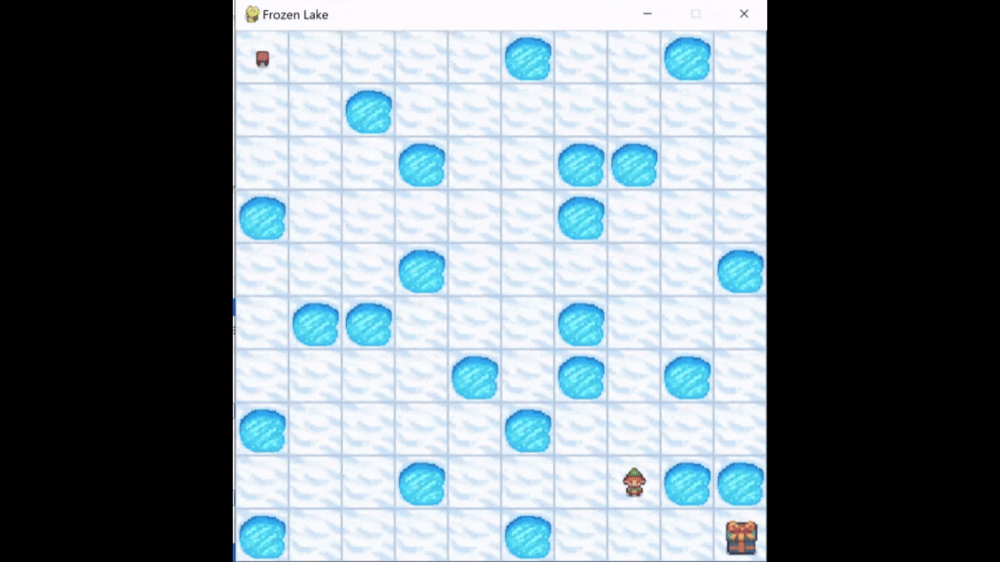

#### Describe the path your elf takes here.

***The path my elf takes is 4 right, 2 down, 1 right, 2 down, 2 right, 5 down, and finally 2 right to get the gift.***

#### Describe how well your Q-Learning model performed here.

***I feel like me Q-Learning model performed pretty well. The Sucsess rate after 1000 episodes was 89.8% and on average the amount of steps it took to get the gift was 19.329 steps. It had a Learning rate of 0.7 allowing it to explore most of the maze before starting to exploit and chose the best path. Since it had so much exploration my discount factor of 0.75 could find the best path while taking as many tiles into account for the best long term reward. My reward system was if the agent stepped on a normal tile it would lose a point (-1) mainly to stop it from just going back and forth and not learning anything. Falling in the lake is -50 and ends game which stops the agent from just going in a lake and then keep going. Finally my gift was +50 and end game this gives the agent a reward for reaching the end and also updating the Q-table for future episodes trying to find a better path (if there is one).***